## Imports

In [21]:
# if necessary to install all the packages, run:
# !pip install -r requirements.txt

In [1]:
%load_ext lab_black

import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
import warnings
import time
import os
import json
import zipfile
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go
from imblearn.pipeline import Pipeline, make_pipeline
from imblearn.over_sampling import SMOTE

from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder
from sklearn.model_selection import (
    train_test_split,
    GridSearchCV,
    cross_val_score,
    StratifiedKFold,
)
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import (
    confusion_matrix,
    accuracy_score,
    classification_report,
    roc_auc_score,
    f1_score,
    precision_score,
    recall_score,
)
from sklearn.manifold import TSNE
from imblearn.base import BaseSampler
from imblearn.over_sampling.base import BaseOverSampler
from sklearn.compose import ColumnTransformer, make_column_transformer


from sklearn.model_selection import KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler, FunctionTransformer, OneHotEncoder
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.metrics import (
    confusion_matrix,
    accuracy_score,
    classification_report,
    roc_auc_score,
    f1_score,
    precision_score,
    recall_score,
)
from autorank import autorank, plot_stats, create_report, latex_table

import sdgym
from sdv.metadata import SingleTableMetadata
from sdv.single_table import (
    CTGANSynthesizer,
    TVAESynthesizer,
    GaussianCopulaSynthesizer,
    CopulaGANSynthesizer,
)
from sdv.lite import SingleTablePreset
from sdv.evaluation.single_table import (
    evaluate_quality,
    get_column_plot,
    get_column_pair_plot,
    run_diagnostic,
)
from sdv.sampling import Condition
from imblearn.utils import check_target_type
from scipy import sparse

warnings.filterwarnings("ignore")
sns.set(style="darkgrid", font_scale=0.5)
custom_palette = ["#8b4513", "#90ee90", "#545454", "#6a287e", "#f0be00"]
sns.set_palette(custom_palette)

## Funções

In [2]:
def dummy(df, columns):
    dummy_variables = []
    for column in columns:
        dummies = pd.get_dummies(df[column], prefix=column)
        dummy_variables.append(dummies)
    return dummy_variables

In [3]:
def mean_std_results(mean_df, std_df):
    concatenated_results = []

    for index, row_mean in mean_df.iterrows():
        classificador = row_mean["Classification"]
        row_std = std_df.loc[std_df["Classification"] == classificador].squeeze()

        accuracy = f"{row_mean['Accuracy']:.4f} +- {row_std['Accuracy']:.2f}"
        precision = f"{row_mean['Precision']:.4f} +- {row_std['Precision']:.2f}"
        recall = f"{row_mean['Recall']:.4f} +- {row_std['Recall']:.2f}"
        f1 = f"{row_mean['F1 Score']:.4f} +- {row_std['F1 Score']:.2f}"
        roc_auc = f"{row_mean['ROC/AUC']:.4f} +- {row_std['ROC/AUC']:.2f}"

        concatenated_results.append(
            {
                "Classification": classificador,
                "Accuracy": accuracy,
                "Precision": precision,
                "Recall": recall,
                "F1 Score": f1,
                "ROC/AUC": roc_auc,
            }
        )

    return pd.DataFrame(concatenated_results)

In [9]:
def evaluation_pipeline(
    X,
    y,
    num_features: list,
    cat_features: list,
    sampling_strategy: str,
    float_to_int_features=None,
    metadata=None,
    target=None,
):
    print(f"Sampling Strategy: {sampling_strategy}")
    np.random.seed(42)

    num_outer_loop_folds = 5
    num_inner_loop_folds = 5
    results = []

    models = [
        (
            "SVM",
            SVC(),
            {"model__C": [0.1, 0.5, 1, 5, 10], "model__kernel": ["linear", "rbf"]},
        ),
        (
            "Decision Tree",
            DecisionTreeClassifier(),
            {
                "model__max_depth": [None, 1, 2, 5, 10],
                "model__min_samples_split": [2, 5, 10],
                "model__min_samples_leaf": [1, 5],
            },
        ),
        (
            "KNN",
            KNeighborsClassifier(),
            {
                "model__n_neighbors": [1, 3, 5, 7, 10],
                "model__weights": ["uniform", "distance"],
            },
        ),
        (
            "Random Forest",
            RandomForestClassifier(),
            {
                "model__n_estimators": [100, 200, 300],
                "model__max_depth": [None, 5, 10],
                "model__min_samples_split": [2, 5],
                "model__min_samples_leaf": [1, 5],
            },
        ),
        (
            "Logistic Regression",
            LogisticRegression(max_iter=1000),
            {
                "model__C": [0.1, 0.5, 1, 5, 10],
                "model__solver": ["liblinear", "sag", "saga"],
            },
        ),
        (
            "MLP",
            MLPClassifier(max_iter=1000),
            {
                "model__hidden_layer_sizes": [(100,), (100, 50)],
                "model__alpha": [0.0001, 0.001, 0.01],
            },
        ),
    ]

    columns_order = X.columns.tolist()

    num_transformer = ("numerical_standard_scaler", StandardScaler(), num_features)
    cat_transformer = ("categorical_onehot", OneHotEncoder(), cat_features)
    transformers = [cat_transformer, num_transformer]
    # transformers = [num_transformer]

    for name, model, param_grid in models:
        print(f"\nTraining Model: {model}")
        folds = KFold(n_splits=num_outer_loop_folds, shuffle=True).split(X, y)
        for i, (train_index, test_index) in enumerate(folds):
            print(f"Training fold {i + 1}...")

            X_train, y_train = X.iloc[train_index, :], y.iloc[train_index]
            X_test, y_test = X.iloc[test_index, :], y.iloc[test_index]

            normalization_step = (
                "normalization",
                ColumnTransformer(transformers=transformers, remainder="passthrough"),
            )
            model_step = ("model", model)

            if sampling_strategy == "TBTR":
                balance_classes_step = (
                    "resampling_tbtr",
                    SDVPipelineTBTR(
                        metadata=metadata,
                        target=target,
                        num_features=num_features,
                        cat_features=cat_features,
                        columns_order=columns_order,
                        float_to_int_features=float_to_int_features,
                    ),
                )
                steps = [balance_classes_step, normalization_step, model_step]
            elif sampling_strategy == "TSTR":
                balance_classes_step = (
                    "resampling_tstr",
                    SDVPipelineTSTR(
                        metadata=metadata,
                        target=target,
                        num_features=num_features,
                        cat_features=cat_features,
                        columns_order=columns_order,
                        float_to_int_features=float_to_int_features,
                    ),
                )
                steps = [balance_classes_step, normalization_step, model_step]
            elif sampling_strategy == "SMOTE":
                balance_classes_step = ("resampling_smote", SMOTE(random_state=42))
                steps = [balance_classes_step, normalization_step, model_step]
            elif sampling_strategy == "BASELINE":
                steps = [normalization_step, model_step]

            pipeline = Pipeline(steps=steps)

            clf = GridSearchCV(
                pipeline,
                param_grid,
                cv=num_inner_loop_folds,
                n_jobs=-1,
                scoring="accuracy",
            )  # scoring = accuracy ou roc_auc?
            clf.fit(X_train, y_train)

            y_pred = clf.predict(X_test)
            accuracy_test = accuracy_score(y_test, y_pred)
            f1_test = f1_score(y_test, y_pred)
            precision_test = precision_score(y_test, y_pred)
            recall_test = recall_score(y_test, y_pred)
            roc_auc_test = roc_auc_score(y_test, y_pred)

            results.append(
                {
                    "Classification": name,
                    "Accuracy": round(accuracy_test, 4),
                    "Precision": round(precision_test, 4),
                    "Recall": round(recall_test, 4),
                    "F1 Score": round(f1_test, 4),
                    "ROC/AUC": round(roc_auc_test, 4),
                }
            )

    mean_df = pd.DataFrame(results).groupby(["Classification"], as_index=False).mean()
    std_df = pd.DataFrame(results).groupby(["Classification"], as_index=False).std()
    results_df = mean_std_results(mean_df, std_df)
    return results_df

In [10]:
# TBTR (Treinar com Dados Balanceados [SDV + Dados Reais] , Testar com Dados Reais)
class SDVPipelineTBTR(BaseSampler):
    _sampling_type = "over-sampling"

    _parameter_constraints = {
        "X": [pd.DataFrame],
        "y": [pd.DataFrame, pd.Series],
        "metadata": [object],
        "target": [str],
        "num_features": [list],
        "cat_features": [list],
    }

    def __init__(
        self,
        metadata,
        target,
        num_features,
        cat_features,
        columns_order,
        float_to_int_features,
    ):
        self.metadata = metadata
        self.target = target
        self.num_features = num_features
        self.cat_features = cat_features
        self.columns_order = columns_order
        self.float_to_int_features = float_to_int_features
        self.synthesizer = SingleTablePreset(self.metadata, name="FAST_ML")
        super().__init__()

    def _fit_resample(self, X, y):
        X = pd.DataFrame(X, columns=self.columns_order).reset_index(drop=True)
        y = pd.DataFrame(y, columns=[self.target]).reset_index(drop=True)
        df_train = pd.merge(X, y, left_index=True, right_index=True)

        for col in self.float_to_int_features:
            X[col] = X[col].astype(int)
            df_train[col] = df_train[col].astype(int)

        X.to_csv("X.csv", index=False)
        y.to_csv("y.csv", index=False)
        df_train.to_csv("df_train.csv", index=False)

        self.synthesizer.fit(df_train)

        class_counts = y[self.target].value_counts()
        minority_class = class_counts.idxmin()
        synthetic_samples_needed = class_counts.max() - class_counts.min()

        if minority_class == 0:
            balanced_conditions_0 = Condition(
                num_rows=synthetic_samples_needed,
                column_values={self.target: 0},
            )
            df_synth = self.synthesizer.sample_from_conditions(
                conditions=[balanced_conditions_0]
            )
        elif minority_class == 1:
            balanced_conditions_1 = Condition(
                num_rows=synthetic_samples_needed,
                column_values={self.target: 1},
            )
            df_synth = self.synthesizer.sample_from_conditions(
                conditions=[balanced_conditions_1]
            )

        X_balanced = pd.concat(
            [
                X.reset_index(drop=True),
                df_synth.drop(self.target, axis=1).reset_index(drop=True),
            ],
            axis=0,
            ignore_index=True,
        )

        y_balanced = pd.concat(
            [y.reset_index(drop=True), df_synth[[self.target]].reset_index(drop=True)],
            axis=0,
            ignore_index=True,
        )

        if sparse.issparse(X):
            X_balanced = sparse.vstack([X_balanced], format=X.format)
        else:
            X_balanced = np.vstack([X_balanced])

        y_balanced = pd.Series(np.ravel(y_balanced))

        self.X_balanced = X_balanced
        self.y_balanced = y_balanced

        X = X_balanced
        y = y_balanced

        return X_balanced, y_balanced

In [11]:
# TSTR (Treinar com Dados Sintéticos, Testar com Dados Reais)
# Dados Sintéticos Balanceados
class SDVPipelineTSTR(BaseSampler):
    _sampling_type = "over-sampling"

    _parameter_constraints = {
        "X": [pd.DataFrame],
        "y": [pd.DataFrame, pd.Series],
        "metadata": [object],
        "target": [str],
        "num_features": [list],
        "cat_features": [list],
    }

    def __init__(
        self,
        metadata,
        target,
        num_features,
        cat_features,
        columns_order,
        float_to_int_features,
    ):
        self.metadata = metadata
        self.target = target
        self.num_features = num_features
        self.cat_features = cat_features
        self.columns_order = columns_order
        self.float_to_int_features = float_to_int_features
        self.synthesizer = SingleTablePreset(self.metadata, name="FAST_ML")
        super().__init__()

    def _fit_resample(self, X, y):
        X = pd.DataFrame(X, columns=self.columns_order).reset_index(drop=True)
        y = pd.DataFrame(y, columns=[self.target]).reset_index(drop=True)
        df_train = pd.merge(X, y, left_index=True, right_index=True)

        for col in self.float_to_int_features:
            X[col] = X[col].astype(int)
            df_train[col] = df_train[col].astype(int)

        self.synthesizer.fit(df_train)

        class_counts = y[self.target].value_counts()
        majority_class = class_counts.idxmax()
        synthetic_samples_needed = class_counts.max()

        balanced_conditions_0 = Condition(
            num_rows=synthetic_samples_needed,
            column_values={self.target: 0},
        )

        balanced_conditions_1 = Condition(
            num_rows=synthetic_samples_needed,
            column_values={self.target: 1},
        )

        df_synth = self.synthesizer.sample_from_conditions(
            conditions=[balanced_conditions_0, balanced_conditions_1]
        )

        X_train_synth = df_synth.drop(self.target, axis=1)
        y_train_synth = df_synth[self.target]

        if sparse.issparse(X):
            X_train_synth = sparse.vstack([X_train_synth], format=X.format)
        else:
            X_train_synth = np.vstack([X_train_synth])

        y_train_synth = pd.Series(np.ravel(y_train_synth))

        self.X_train_synth = X_train_synth
        self.y_train_synth = y_train_synth

        X = X_train_synth
        y = y_train_synth

        return X_train_synth, y_train_synth

In [12]:
def plot_categorical_balance(data, cat_features):
    plt.figure(figsize=(10, 20))
    rows = len(cat_features)
    cols = 2

    for i, feature in enumerate(cat_features, start=1):
        plt.subplot(rows, cols, i)
        sns.countplot(x=feature, data=data)
        plt.title(f"{feature} - Value Counts")

    plt.tight_layout()
    plt.show()

In [13]:
def convert_csv_to_zip_with_metadata(input_path, output_path):
    file_names = os.listdir(input_path)

    for file_name in file_names:
        if file_name.endswith(".csv"):
            csv_file = os.path.join(input_path, file_name)
            json_file = os.path.join(input_path, "metadata.json")
            if os.path.exists(json_file):
                zip_file_name = os.path.splitext(file_name)[0] + ".zip"
                zip_file_path = os.path.join(output_path, zip_file_name)

                with zipfile.ZipFile(zip_file_path, "w", zipfile.ZIP_DEFLATED) as zipf:
                    zipf.write(csv_file, arcname=os.path.basename(csv_file))
                    zipf.write(json_file, arcname="metadata.json")

## Análise do Dataset (EDA)

In [7]:
df = pd.read_csv("data/heart_cleveland/heart_cleveland.csv")
df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,condition
0,69,1,0,160,234,1,2,131,0,0.1,1,1,0,0
1,69,0,0,140,239,0,0,151,0,1.8,0,2,0,0
2,66,0,0,150,226,0,0,114,0,2.6,2,0,0,0
3,65,1,0,138,282,1,2,174,0,1.4,1,1,0,1
4,64,1,0,110,211,0,2,144,1,1.8,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,40,1,3,152,223,0,0,181,0,0.0,0,0,2,1
293,39,1,3,118,219,0,0,140,0,1.2,1,0,2,1
294,35,1,3,120,198,0,0,130,1,1.6,1,0,2,1
295,35,0,3,138,183,0,0,182,0,1.4,0,0,0,0


In [11]:
df.condition.value_counts()

0    160
1    137
Name: condition, dtype: int64

In [12]:
perc = df.condition.value_counts()[1] / df.condition.value_counts()[0]
perc

0.85625

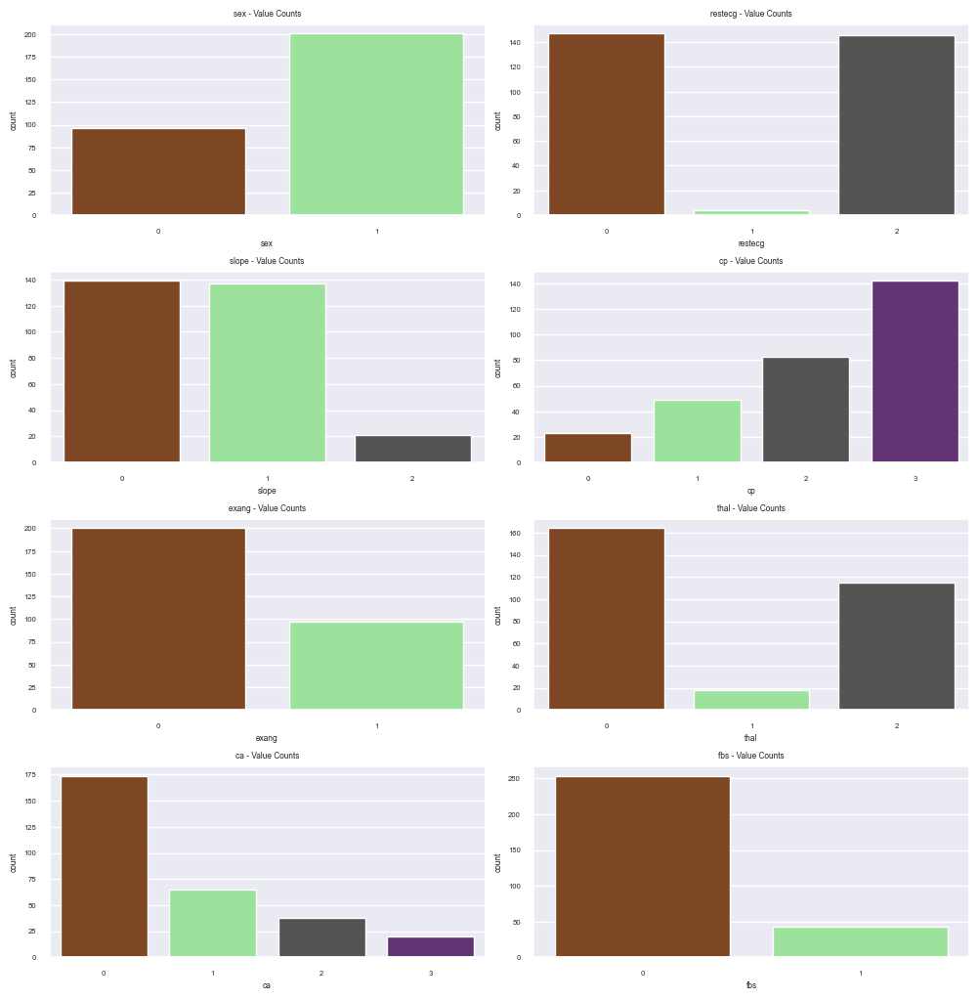

In [13]:
plot_categorical_balance(df, cat_features)

In [14]:
profile = ProfileReport(
    df, title="Profiling Dataset", html={"style": {"full_width": True}}
)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Informações Gerais sobre o Dataset

| Nome do Atributo | Papel | Tipo | Descrição | Unidades |
| --- | --- | --- | --- | --- |
| age | Feature | Discreto | Idade | anos |
| sex | Feature | Categórico | Sexo | 1 = masculino, 0 = feminino |
| cp | Feature | Categórico | Tipo de Dor no Peito | 0 = angina típica; 1 = angina atípica; 2 = dor não anginosa; 3 = assintomático |
| trestbps | Feature | Discreto | Pressão Arterial de Repouso (na admissão ao hospital) | mm Hg |
| chol | Feature | Discreto | Colesterol Sérico | mg/dl |
| fbs | Feature | Categórico | Açúcar no Sangue em Jejum > 120 mg/dl | 1 = true; 0 = false |
| restecg | Feature | Categórico | Eletrocardiograma de Repouso | 0 = normal; 1 = anormalidade na onda ST-T; 2 = hipertrofia ventricular esquerda |
| thalach | Feature | Discreto | Frequência Cardíaca Máxima Atingida | Hz |
| exang | Feature | Categórico | Angina Induzida por Exercício | 1 = true; 0 = false |
| oldpeak | Feature | Discreto | Depressão de ST Induzida por Exercício em Relação ao Repouso | float |
| slope | Feature | Categórico | Inclinação do Segmento ST de Pico do Exercício | 0 = ascendente; 1 = plano; 2 = descendente |
| ca | Feature | Discreto | Número de Vasos Principais coloridos por Fluoroscopia | 0-3 |
| thal | Feature | Categórico | Classificação da Frequência Cardíaca Máxima Atingida | 0 = normal; 1 = defeito fixo; 2 = defeito reversível |
| condition | Label | Categórico | Condição | 0 = sem doença; 1 = doença |


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 297 entries, 0 to 296
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   age        297 non-null    int64  
 1   sex        297 non-null    int64  
 2   cp         297 non-null    int64  
 3   trestbps   297 non-null    int64  
 4   chol       297 non-null    int64  
 5   fbs        297 non-null    int64  
 6   restecg    297 non-null    int64  
 7   thalach    297 non-null    int64  
 8   exang      297 non-null    int64  
 9   oldpeak    297 non-null    float64
 10  slope      297 non-null    int64  
 11  ca         297 non-null    int64  
 12  thal       297 non-null    int64  
 13  condition  297 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 32.6 KB


In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,297.0,54.542088,9.049736,29.0,48.0,56.0,61.0,77.0
sex,297.0,0.676768,0.468500,0.0,0.0,1.0,1.0,1.0
cp,297.0,2.158249,0.964859,0.0,2.0,2.0,3.0,3.0
trestbps,297.0,131.693603,17.762806,94.0,120.0,130.0,140.0,200.0
chol,297.0,247.350168,51.997583,126.0,211.0,243.0,276.0,564.0
fbs,297.0,0.144781,0.352474,0.0,0.0,0.0,0.0,1.0
restecg,297.0,0.996633,0.994914,0.0,0.0,1.0,2.0,2.0
thalach,297.0,149.599327,22.941562,71.0,133.0,153.0,166.0,202.0
exang,297.0,0.326599,0.469761,0.0,0.0,0.0,1.0,1.0
oldpeak,297.0,1.055556,1.166123,0.0,0.0,0.8,1.6,6.2


## Criando os Dados Sintetizados

### Metadata

In [8]:
df = pd.read_csv("data/heart_cleveland/heart_cleveland.csv")
df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,condition
0,69,1,0,160,234,1,2,131,0,0.1,1,1,0,0
1,69,0,0,140,239,0,0,151,0,1.8,0,2,0,0
2,66,0,0,150,226,0,0,114,0,2.6,2,0,0,0
3,65,1,0,138,282,1,2,174,0,1.4,1,1,0,1
4,64,1,0,110,211,0,2,144,1,1.8,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,40,1,3,152,223,0,0,181,0,0.0,0,0,2,1
293,39,1,3,118,219,0,0,140,0,1.2,1,0,2,1
294,35,1,3,120,198,0,0,130,1,1.6,1,0,2,1
295,35,0,3,138,183,0,0,182,0,1.4,0,0,0,0


In [65]:
metadata = SingleTableMetadata()
metadata.detect_from_dataframe(data=df)
metadata

{
    "columns": {
        "age": {
            "sdtype": "numerical"
        },
        "sex": {
            "sdtype": "numerical"
        },
        "cp": {
            "sdtype": "numerical"
        },
        "trestbps": {
            "sdtype": "numerical"
        },
        "chol": {
            "sdtype": "numerical"
        },
        "fbs": {
            "sdtype": "numerical"
        },
        "restecg": {
            "sdtype": "numerical"
        },
        "thalach": {
            "sdtype": "numerical"
        },
        "exang": {
            "sdtype": "numerical"
        },
        "oldpeak": {
            "sdtype": "numerical"
        },
        "slope": {
            "sdtype": "numerical"
        },
        "ca": {
            "sdtype": "numerical"
        },
        "thal": {
            "sdtype": "numerical"
        },
        "condition": {
            "sdtype": "numerical"
        }
    },
    "METADATA_SPEC_VERSION": "SINGLE_TABLE_V1"
}

In [306]:
# check errors

metadata.validate()

- cat_features = ["sex", "restecg", "slope", "cp", "exang", "thal", "ca", "fbs"]
- num_features = ["age", "oldpeak", "trestbps", "thalach", "chol"]

In [307]:
df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,condition
0,69,1,0,160,234,1,2,131,0,0.1,1,1,0,0
1,69,0,0,140,239,0,0,151,0,1.8,0,2,0,0
2,66,0,0,150,226,0,0,114,0,2.6,2,0,0,0
3,65,1,0,138,282,1,2,174,0,1.4,1,1,0,1
4,64,1,0,110,211,0,2,144,1,1.8,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,40,1,3,152,223,0,0,181,0,0.0,0,0,2,1
293,39,1,3,118,219,0,0,140,0,1.2,1,0,2,1
294,35,1,3,120,198,0,0,130,1,1.6,1,0,2,1
295,35,0,3,138,183,0,0,182,0,1.4,0,0,0,0


In [308]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 297 entries, 0 to 296
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   age        297 non-null    int64  
 1   sex        297 non-null    int64  
 2   cp         297 non-null    int64  
 3   trestbps   297 non-null    int64  
 4   chol       297 non-null    int64  
 5   fbs        297 non-null    int64  
 6   restecg    297 non-null    int64  
 7   thalach    297 non-null    int64  
 8   exang      297 non-null    int64  
 9   oldpeak    297 non-null    float64
 10  slope      297 non-null    int64  
 11  ca         297 non-null    int64  
 12  thal       297 non-null    int64  
 13  condition  297 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 32.6 KB


In [66]:
metadata.update_column(
    column_name="age", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="oldpeak", sdtype="numerical", computer_representation="Float"
)

metadata.update_column(
    column_name="trestbps", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="thalach", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="chol", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="sex", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="restecg", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="slope", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="cp", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="exang", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="thal", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="ca", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="fbs", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="condition", sdtype="numerical", computer_representation="Int32"
)

In [11]:
metadata

{
    "METADATA_SPEC_VERSION": "SINGLE_TABLE_V1",
    "columns": {
        "age": {
            "sdtype": "numerical",
            "computer_representation": "Int32"
        },
        "sex": {
            "sdtype": "numerical",
            "computer_representation": "Int32"
        },
        "cp": {
            "sdtype": "numerical",
            "computer_representation": "Int32"
        },
        "trestbps": {
            "sdtype": "numerical",
            "computer_representation": "Int32"
        },
        "chol": {
            "sdtype": "numerical",
            "computer_representation": "Int32"
        },
        "fbs": {
            "sdtype": "numerical",
            "computer_representation": "Int32"
        },
        "restecg": {
            "sdtype": "numerical",
            "computer_representation": "Int32"
        },
        "thalach": {
            "sdtype": "numerical",
            "computer_representation": "Int32"
        },
        "exang": {
            "sdtype":

In [13]:
metadata.save_to_json(filepath="data/heart_cleveland/metadata.json")

In [14]:
convert_csv_to_zip_with_metadata("data/heart_cleveland/", "data/my_custom_datasets/")

### Constraints

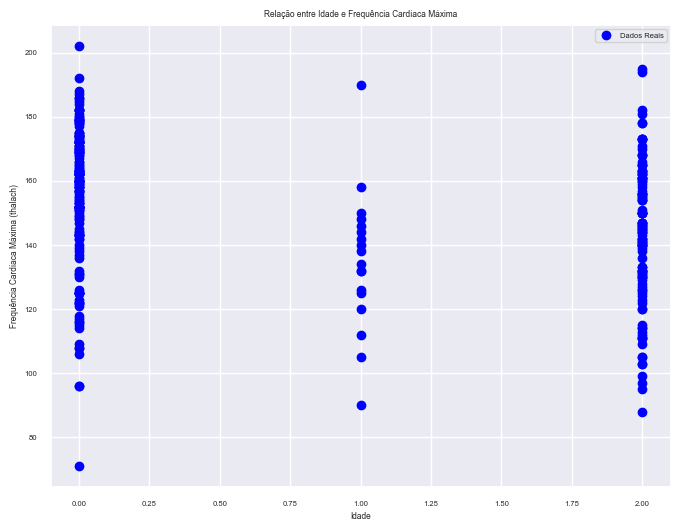

In [157]:
import matplotlib.pyplot as plt

# Dados reais do DataFrame df
age = df["thal"]
thalach = df["thalach"]

plt.figure(figsize=(8, 6))
plt.scatter(age, thalach, c="blue", marker="o", label="Dados Reais")
plt.xlabel("Idade")
plt.ylabel("Frequência Cardíaca Máxima (thalach)")
plt.title("Relação entre Idade e Frequência Cardíaca Máxima")
plt.legend()
plt.grid(True)
plt.show()

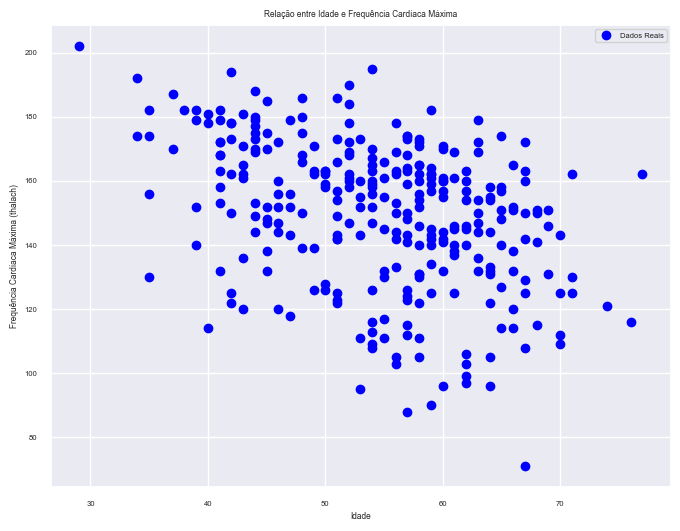

In [158]:
import matplotlib.pyplot as plt

# Dados reais do DataFrame df
age = df["age"]
thalach = df["thalach"]

plt.figure(figsize=(8, 6))
plt.scatter(age, thalach, c="blue", marker="o", label="Dados Reais")
plt.xlabel("Idade")
plt.ylabel("Frequência Cardíaca Máxima (thalach)")
plt.title("Relação entre Idade e Frequência Cardíaca Máxima")
plt.legend()
plt.grid(True)
plt.show()

- a depressão de ST induzida por exercício em relação ao repouso (oldpeak) deve ser menor ou igual à frequência cardíaca máxima (thalach)
- a pressão arterial (trestbps) não pode ser negativa

In [67]:
age_constraint = {
    "constraint_class": "ScalarRange",
    "constraint_parameters": {
        "column_name": "age",
        "low_value": 29.0,
        "high_value": 77.0,
        "strict_boundaries": False,
    },
}

# trestbps_constraint = {
#     "constraint_class": "ScalarRange",
#     "constraint_parameters": {
#         "column_name": "trestbps",
#         "low_value": 94.0,
#         "high_value": 200.0,
#         "strict_boundaries": False,
#     },
# }

# chol_constraint = {
#     "constraint_class": "ScalarRange",
#     "constraint_parameters": {
#         "column_name": "chol",
#         "low_value": 126.0,
#         "high_value": 564.0,
#         "strict_boundaries": False,
#     },
# }

# thalach_constraint = {
#     "constraint_class": "ScalarRange",
#     "constraint_parameters": {
#         "column_name": "thalach",
#         "low_value": 71.0,
#         "high_value": 202.0,
#         "strict_boundaries": False,
#     },
# }

# freq_constraint = {
#     "constraint_class": "Inequality",
#     "constraint_parameters": {
#         "low_column_name": "oldpeak",
#         "high_column_name": "thalach",
#         "strict_boundaries": True,
#     },
# }

# condition_constraint = {
#     "constraint_class": "FixedCombinations",
#     "constraint_parameters": {
#         "column_names": [
#             "age",
#             "cp",
#             "chol",
#             "fbs",
#             "thalach",
#             "oldpeak",
#             "ca",
#             "thal",
#             "slope",
#             "condition",
#         ]
#     },
# }

### Synthesizers

#### CTGAN

In [84]:
synthesizer = CTGANSynthesizer(metadata)
synthesizer.add_constraints(constraints=[age_constraint])

In [85]:
start_time = time.time()

synthesizer.fit(df)

end_time = time.time()

ctgan_time = round(end_time - start_time, 3)

In [86]:
ctgan_time

162.42

In [87]:
synthesizer.save("models/heart_cleveland/CTGAN_synthesizer.pkl")

In [88]:
synthesizer = CTGANSynthesizer.load("models/heart_cleveland/CTGAN_synthesizer.pkl")

In [89]:
df_synth = synthesizer.sample(297)

Sampling rows: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 297/297 [00:00<00:00, 1448.79it/s]


In [90]:
quality_report = evaluate_quality(df, df_synth, metadata)

Creating report: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 12.50it/s]


Overall Quality Score: 85.54%

Properties:
Column Shapes: 80.42%
Column Pair Trends: 90.65%


In [91]:
diagnostic_report = run_diagnostic(
    real_data=df, synthetic_data=df_synth, metadata=metadata
)

diagnostic_report

Creating report: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:04<00:00,  1.03s/it]


DiagnosticResults:

SUCCESS:
✓ The synthetic data covers over 90% of the numerical ranges present in the real data
✓ Over 90% of the synthetic rows are not copies of the real data
✓ The synthetic data follows over 90% of the min/max boundaries set by the real data


In [92]:
ctgan_score = quality_report.get_score()
ctgan_score = round(ctgan_score, 3)
ctgan_score

0.855

In [93]:
results_shape = quality_report.get_details(property_name="Column Shapes")
results_pair = quality_report.get_details(property_name="Column Pair Trends")

results_shape = results_shape.groupby(by="Metric").mean().reset_index()
results_shape["Model"] = "CTGAN"
results_shape = results_shape[["Model", "Metric", "Quality Score"]]

results_pair = results_pair.groupby(by="Metric").mean().reset_index()
results_pair["Model"] = "CTGAN"
results_pair = results_pair[["Model", "Metric", "Quality Score"]]

result_ctgan = pd.concat([results_shape, results_pair], ignore_index=True)
result_ctgan

,Model,Metric,Quality Score
0,CTGAN,KSComplement,0.804233
1,CTGAN,CorrelationSimilarity,0.906476


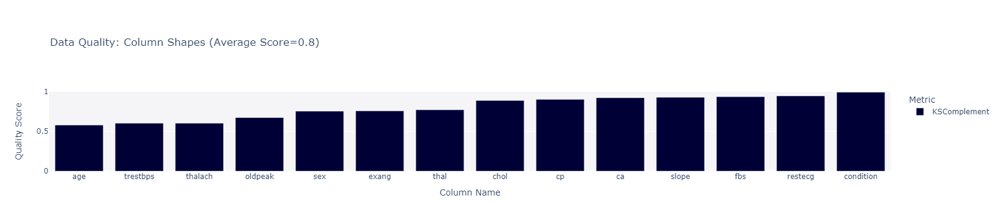

In [94]:
quality_report.get_visualization("Column Shapes")

#### CopulaGAN

In [95]:
synthesizer = CopulaGANSynthesizer(metadata)
synthesizer.add_constraints(constraints=[age_constraint])

In [96]:
start_time = time.time()

synthesizer.fit(df)

end_time = time.time()

copula_time = round(end_time - start_time, 3)

In [97]:
copula_time

175.714

In [98]:
synthesizer.save("models/heart_cleveland/CopulaGAN_synthesizer.pkl")

In [99]:
synthesizer = CopulaGANSynthesizer.load(
    "models/heart_cleveland/CopulaGAN_synthesizer.pkl"
)

In [100]:
df_synth = synthesizer.sample(297)

Sampling rows: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 297/297 [00:00<00:00, 1242.69it/s]


In [101]:
quality_report = evaluate_quality(df, df_synth, metadata)

Creating report: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 12.23it/s]


Overall Quality Score: 83.52%

Properties:
Column Shapes: 75.97%
Column Pair Trends: 91.06%


In [102]:
diagnostic_report = run_diagnostic(
    real_data=df, synthetic_data=df_synth, metadata=metadata
)

diagnostic_report

Creating report: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:04<00:00,  1.12s/it]


DiagnosticResults:

SUCCESS:
✓ The synthetic data covers over 90% of the numerical ranges present in the real data
✓ Over 90% of the synthetic rows are not copies of the real data
✓ The synthetic data follows over 90% of the min/max boundaries set by the real data


In [103]:
copula_score = quality_report.get_score()
copula_score = round(copula_score, 3)
copula_score

0.835

In [104]:
results_shape = quality_report.get_details(property_name="Column Shapes")
results_pair = quality_report.get_details(property_name="Column Pair Trends")

results_shape = results_shape.groupby(by="Metric").mean().reset_index()
results_shape["Model"] = "CopulaGAN"
results_shape = results_shape[["Model", "Metric", "Quality Score"]]

results_pair = results_pair.groupby(by="Metric").mean().reset_index()
results_pair["Model"] = "CopulaGAN"
results_pair = results_pair[["Model", "Metric", "Quality Score"]]

result_copula = pd.concat([results_shape, results_pair], ignore_index=True)
result_copula

,Model,Metric,Quality Score
0,CopulaGAN,KSComplement,0.759740
1,CopulaGAN,CorrelationSimilarity,0.910632


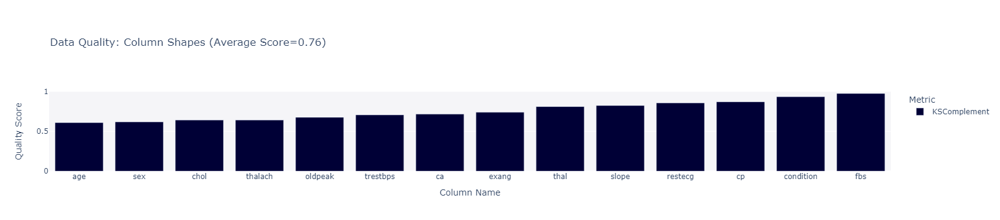

In [105]:
quality_report.get_visualization("Column Shapes")

#### GaussianCopula

In [106]:
synthesizer = GaussianCopulaSynthesizer(metadata)
synthesizer.add_constraints(constraints=[age_constraint])

In [107]:
start_time = time.time()

synthesizer.fit(df)

end_time = time.time()

gaussian_time = round(end_time - start_time, 3)

In [108]:
gaussian_time

1.114

In [109]:
synthesizer.save("models/heart_cleveland/GaussianCopula_synthesizer.pkl")

In [110]:
synthesizer = GaussianCopulaSynthesizer.load(
    "models/heart_cleveland/GaussianCopula_synthesizer.pkl"
)

In [111]:
df_synth = synthesizer.sample(297)

Sampling rows: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 297/297 [00:00<00:00, 4500.05it/s]


In [112]:
quality_report = evaluate_quality(df, df_synth, metadata)

Creating report: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 11.05it/s]


Overall Quality Score: 90.5%

Properties:
Column Shapes: 84.61%
Column Pair Trends: 96.4%


In [113]:
diagnostic_report = run_diagnostic(
    real_data=df, synthetic_data=df_synth, metadata=metadata
)

diagnostic_report

Creating report: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:04<00:00,  1.14s/it]


DiagnosticResults:

SUCCESS:
✓ The synthetic data covers over 90% of the numerical ranges present in the real data
✓ Over 90% of the synthetic rows are not copies of the real data
✓ The synthetic data follows over 90% of the min/max boundaries set by the real data


In [114]:
gaussian_score = quality_report.get_score()
gaussian_score = round(gaussian_score, 3)
gaussian_score

0.905

In [115]:
results_shape = quality_report.get_details(property_name="Column Shapes")
results_pair = quality_report.get_details(property_name="Column Pair Trends")

results_shape = results_shape.groupby(by="Metric").mean().reset_index()
results_shape["Model"] = "GaussianCopula"
results_shape = results_shape[["Model", "Metric", "Quality Score"]]

results_pair = results_pair.groupby(by="Metric").mean().reset_index()
results_pair["Model"] = "GaussianCopula"
results_pair = results_pair[["Model", "Metric", "Quality Score"]]

result_gaussian = pd.concat([results_shape, results_pair], ignore_index=True)
result_gaussian

,Model,Metric,Quality Score
0,GaussianCopula,KSComplement,0.846080
1,GaussianCopula,CorrelationSimilarity,0.963955


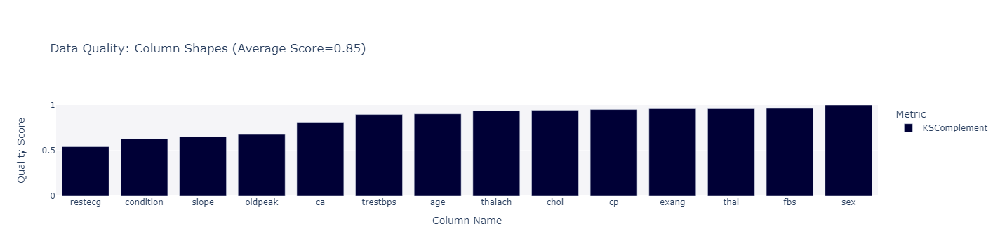

In [116]:
quality_report.get_visualization("Column Shapes")

#### TVAE

In [117]:
synthesizer = TVAESynthesizer(metadata)
synthesizer.add_constraints(constraints=[age_constraint])

In [118]:
start_time = time.time()

synthesizer.fit(df)

end_time = time.time()

tvae_time = round(end_time - start_time, 3)

In [119]:
tvae_time

24.725

In [120]:
synthesizer.save("models/heart_cleveland/TVAE_synthesizer.pkl")

In [121]:
synthesizer = TVAESynthesizer.load("models/heart_cleveland/TVAE_synthesizer.pkl")

In [122]:
df_synth = synthesizer.sample(297)

Sampling rows: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 297/297 [00:00<00:00, 2249.38it/s]


In [123]:
quality_report = evaluate_quality(df, df_synth, metadata)

Creating report: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 12.23it/s]


Overall Quality Score: 87.79%

Properties:
Column Shapes: 81.02%
Column Pair Trends: 94.56%


In [124]:
diagnostic_report = run_diagnostic(
    real_data=df, synthetic_data=df_synth, metadata=metadata
)

diagnostic_report

Creating report: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:04<00:00,  1.10s/it]


DiagnosticResults:

SUCCESS:
✓ Over 90% of the synthetic rows are not copies of the real data
✓ The synthetic data follows over 90% of the min/max boundaries set by the real data

! The synthetic data is missing more than 10% of the numerical ranges present in the real data


In [125]:
tvae_score = quality_report.get_score()
tvae_score = round(tvae_score, 3)
tvae_score

0.878

In [126]:
results_shape = quality_report.get_details(property_name="Column Shapes")
results_pair = quality_report.get_details(property_name="Column Pair Trends")

results_shape = results_shape.groupby(by="Metric").mean().reset_index()
results_shape["Model"] = "TVAE"
results_shape = results_shape[["Model", "Metric", "Quality Score"]]

results_pair = results_pair.groupby(by="Metric").mean().reset_index()
results_pair["Model"] = "TVAE"
results_pair = results_pair[["Model", "Metric", "Quality Score"]]

result_tvae = pd.concat([results_shape, results_pair], ignore_index=True)
result_tvae

,Model,Metric,Quality Score
0,TVAE,KSComplement,0.810245
1,TVAE,CorrelationSimilarity,0.945646


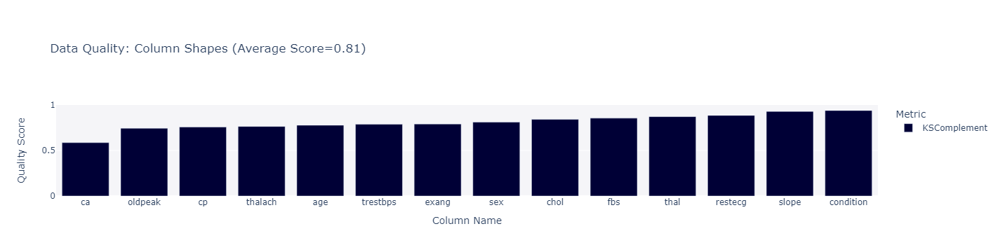

In [127]:
quality_report.get_visualization("Column Shapes")

#### FastML

In [128]:
synthesizer = SingleTablePreset(metadata, name="FAST_ML")
synthesizer.add_constraints(constraints=[age_constraint])

In [129]:
start_time = time.time()

synthesizer.fit(df)

end_time = time.time()

fast_time = round(end_time - start_time, 3)

In [130]:
fast_time

0.118

In [131]:
synthesizer.save("models/heart_cleveland/FastML_synthesizer.pkl")

In [132]:
synthesizer = SingleTablePreset.load("models/heart_cleveland/FastML_synthesizer.pkl")

In [133]:
df_synth = synthesizer.sample(297)

Sampling rows: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 297/297 [00:00<00:00, 4367.66it/s]


In [134]:
quality_report = evaluate_quality(df, df_synth, metadata)

Creating report: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 10.87it/s]


Overall Quality Score: 94.44%

Properties:
Column Shapes: 91.27%
Column Pair Trends: 97.61%


In [135]:
diagnostic_report = run_diagnostic(
    real_data=df, synthetic_data=df_synth, metadata=metadata
)

diagnostic_report

Creating report: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:04<00:00,  1.08s/it]


DiagnosticResults:

SUCCESS:
✓ The synthetic data covers over 90% of the numerical ranges present in the real data
✓ Over 90% of the synthetic rows are not copies of the real data
✓ The synthetic data follows over 90% of the min/max boundaries set by the real data


In [136]:
fast_score = quality_report.get_score()
fast_score = round(fast_score, 3)
fast_score

0.944

In [137]:
results_shape = quality_report.get_details(property_name="Column Shapes")
results_pair = quality_report.get_details(property_name="Column Pair Trends")

results_shape = results_shape.groupby(by="Metric").mean().reset_index()
results_shape["Model"] = "FastML"
results_shape = results_shape[["Model", "Metric", "Quality Score"]]

results_pair = results_pair.groupby(by="Metric").mean().reset_index()
results_pair["Model"] = "FastML"
results_pair = results_pair[["Model", "Metric", "Quality Score"]]

result_fast = pd.concat([results_shape, results_pair], ignore_index=True)
result_fast

,Model,Metric,Quality Score
0,FastML,KSComplement,0.912698
1,FastML,CorrelationSimilarity,0.976062


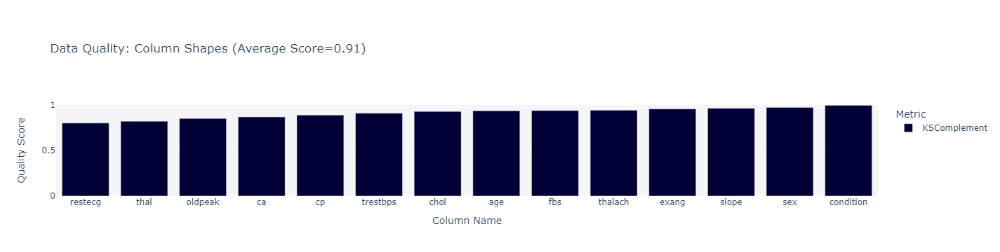

In [138]:
quality_report.get_visualization("Column Shapes")

### Análise da Geração dos Dados Sintéticos

In [139]:
data_score = {
    "Model": ["FastML", "TVAE", "GaussianCopula", "CopulaGAN", "CTGAN"],
    "Mean Score": [
        fast_score,
        tvae_score,
        gaussian_score,
        copula_score,
        ctgan_score,
    ],
    "Time": [fast_time, tvae_time, gaussian_time, copula_time, ctgan_time],
}

df_score = pd.DataFrame(data_score)
df_score = df_score.sort_values(by="Mean Score", ascending=False).reset_index(drop=True)
df_score.to_csv("data/heart_cleveland/results/mean_score.csv", index=False)
df_score

,Model,Mean Score,Time
0,FastML,0.944,0.118
1,GaussianCopula,0.905,1.114
2,TVAE,0.878,24.725
3,CTGAN,0.855,162.420
4,CopulaGAN,0.835,175.714


In [140]:
metrics_score = pd.concat(
    [result_copula, result_ctgan, result_fast, result_gaussian, result_tvae],
    ignore_index=True,
)
metrics_score.to_csv("data/heart_cleveland/results/metrics_score.csv", index=False)
metrics_score

,Model,Metric,Quality Score
0,CopulaGAN,KSComplement,0.759740
1,CopulaGAN,CorrelationSimilarity,0.910632
2,CTGAN,KSComplement,0.804233
3,CTGAN,CorrelationSimilarity,0.906476
4,FastML,KSComplement,0.912698
5,FastML,CorrelationSimilarity,0.976062
6,GaussianCopula,KSComplement,0.846080
7,GaussianCopula,CorrelationSimilarity,0.963955
8,TVAE,KSComplement,0.810245
9,TVAE,CorrelationSimilarity,0.945646


### Comparação Dados Reais vs. Dados Sintéticos

In [294]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 297 entries, 0 to 296
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   age        297 non-null    int64  
 1   sex        297 non-null    int64  
 2   cp         297 non-null    int64  
 3   trestbps   297 non-null    int64  
 4   chol       297 non-null    int64  
 5   fbs        297 non-null    int64  
 6   restecg    297 non-null    int64  
 7   thalach    297 non-null    int64  
 8   exang      297 non-null    int64  
 9   oldpeak    297 non-null    float64
 10  slope      297 non-null    int64  
 11  ca         297 non-null    int64  
 12  thal       297 non-null    int64  
 13  condition  297 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 32.6 KB


In [44]:
df_synth.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 297 entries, 0 to 296
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   age        297 non-null    int64  
 1   sex        297 non-null    int64  
 2   cp         297 non-null    int64  
 3   trestbps   297 non-null    int64  
 4   chol       297 non-null    int64  
 5   fbs        297 non-null    int64  
 6   restecg    297 non-null    int64  
 7   thalach    297 non-null    int64  
 8   exang      297 non-null    int64  
 9   oldpeak    297 non-null    float64
 10  slope      297 non-null    int64  
 11  ca         297 non-null    int64  
 12  thal       297 non-null    int64  
 13  condition  297 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 32.6 KB


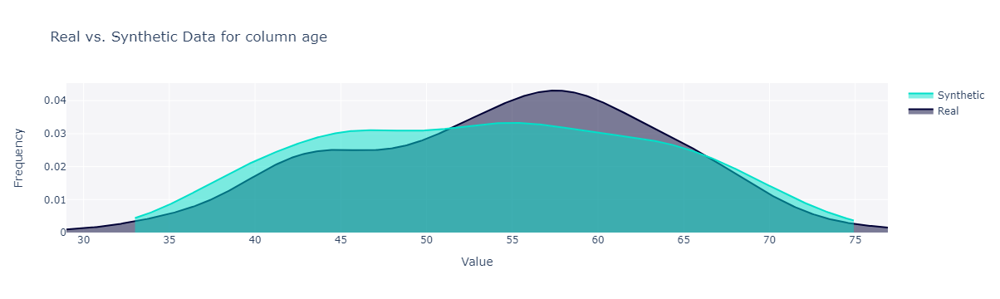

In [217]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="age",
    metadata=metadata,
)

fig.show()

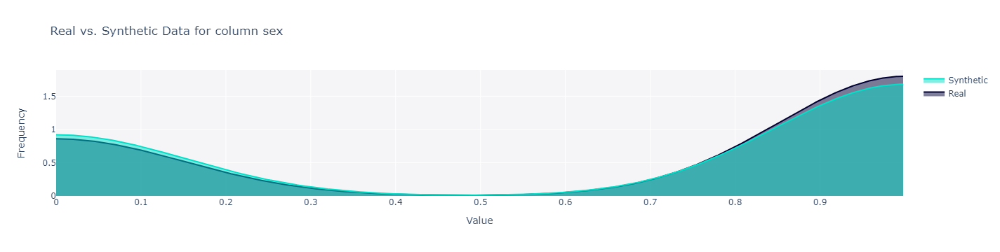

In [218]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="sex",
    metadata=metadata,
)

fig.show()

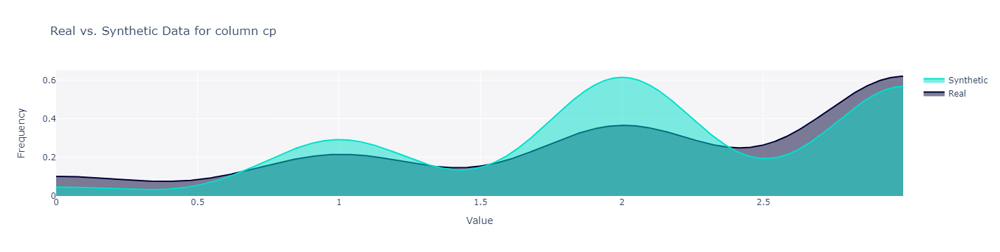

In [219]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="cp",
    metadata=metadata,
)

fig.show()

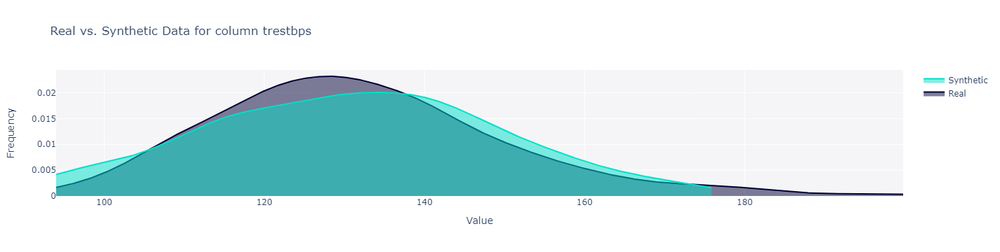

In [220]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="trestbps",
    metadata=metadata,
)

fig.show()

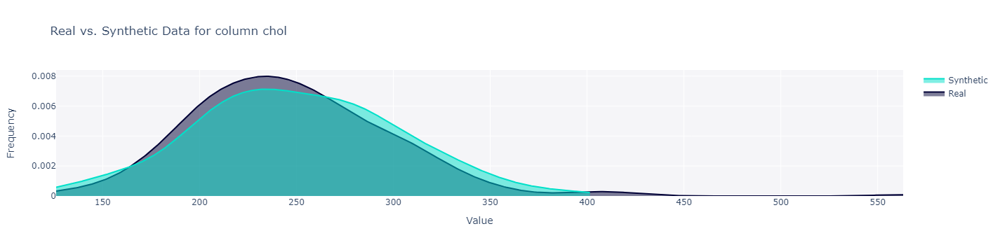

In [221]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="chol",
    metadata=metadata,
)

fig.show()

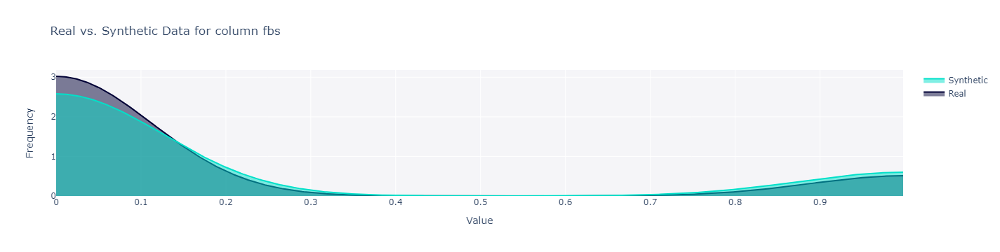

In [222]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="fbs",
    metadata=metadata,
)

fig.show()

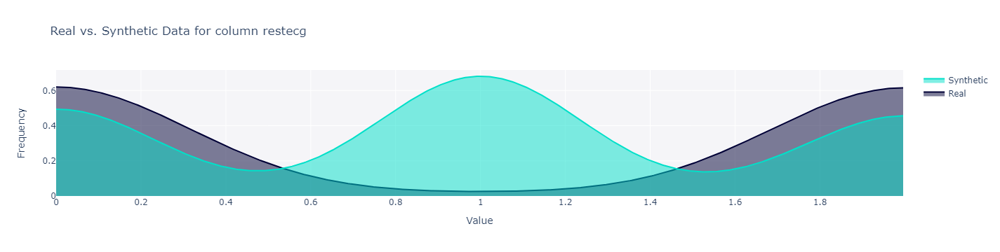

In [223]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="restecg",
    metadata=metadata,
)

fig.show()

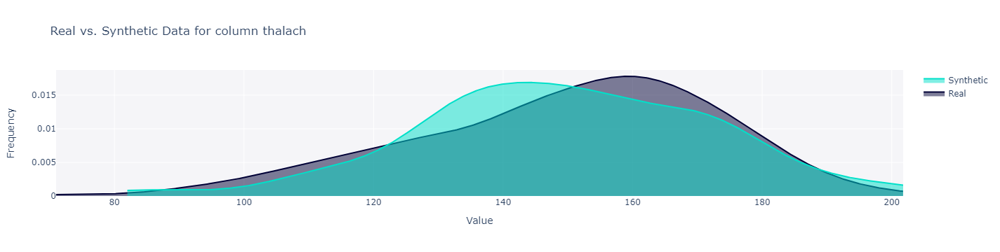

In [224]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="thalach",
    metadata=metadata,
)

fig.show()

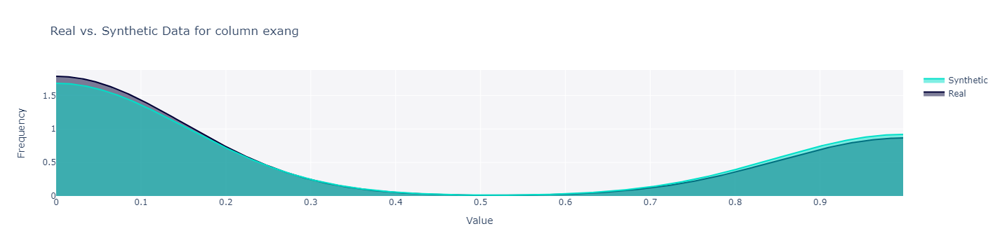

In [225]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="exang",
    metadata=metadata,
)

fig.show()

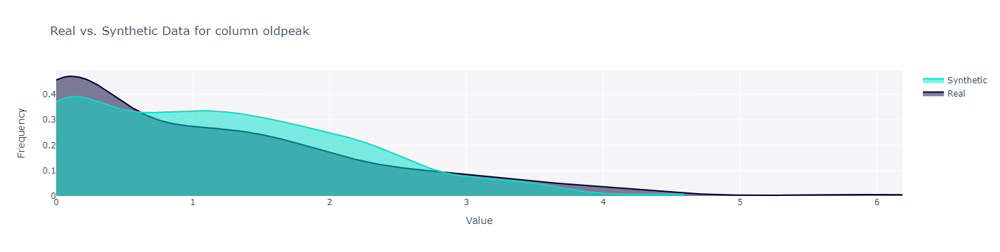

In [226]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="oldpeak",
    metadata=metadata,
)

fig.show()

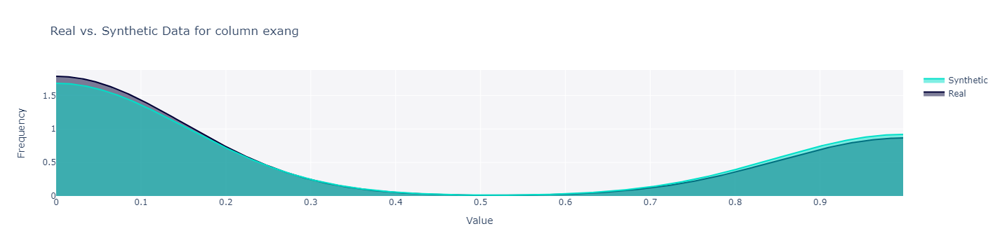

In [227]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="exang",
    metadata=metadata,
)

fig.show()

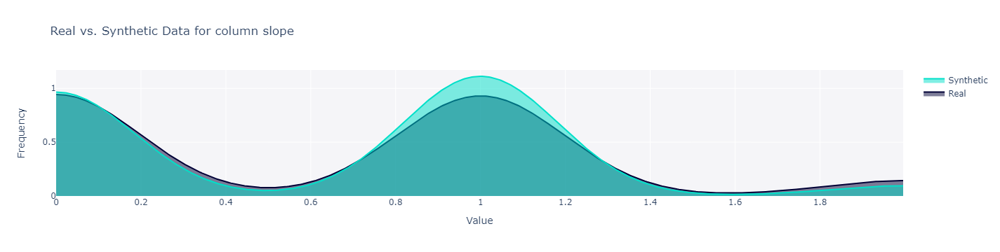

In [228]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="slope",
    metadata=metadata,
)

fig.show()

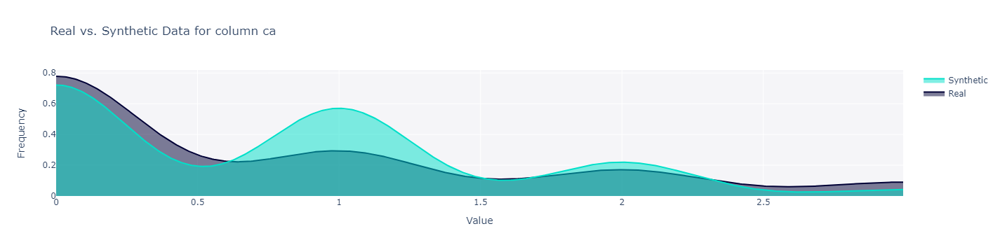

In [229]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="ca",
    metadata=metadata,
)

fig.show()

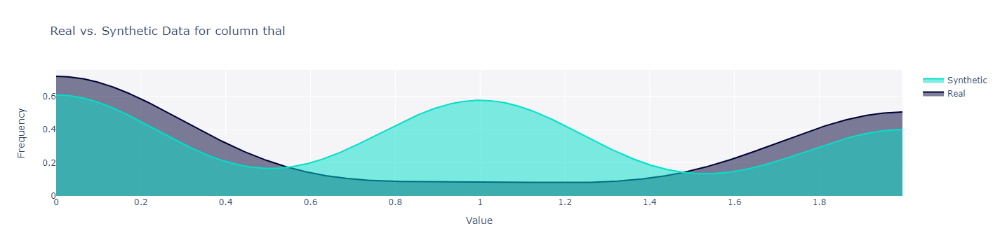

In [230]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="thal",
    metadata=metadata,
)

fig.show()

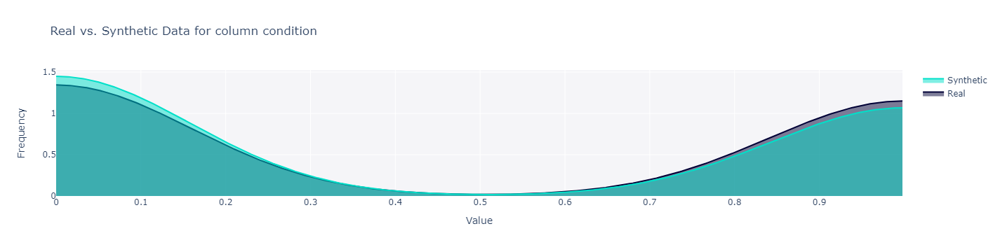

In [231]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_name="condition",
    metadata=metadata,
)

fig.show()

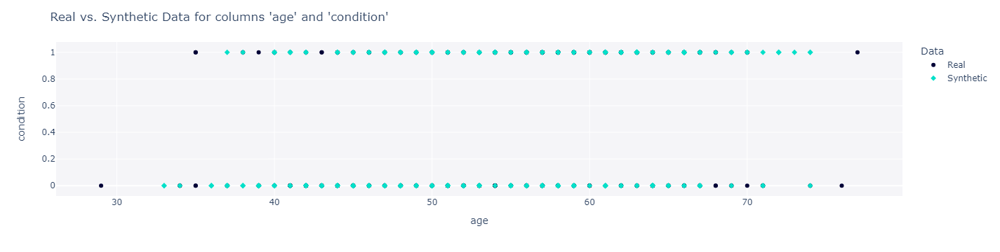

In [32]:
fig = get_column_pair_plot(
    real_data=df,
    synthetic_data=df_synth,
    column_names=["age", "condition"],
    metadata=metadata,
)

fig.show()

### TSNE

In [8]:
df = pd.read_csv("data/heart_cleveland/heart_cleveland.csv")

synthesizer = SingleTablePreset.load("models/heart_cleveland/FastML_synthesizer.pkl")
df_synth = synthesizer.sample(df.shape[0])

X = pd.concat([df, df_synth], axis=0)
y = pd.Series([0] * len(df) + [1] * len(df_synth))

tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X)

Sampling rows: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 297/297 [00:00<00:00, 4500.15it/s]


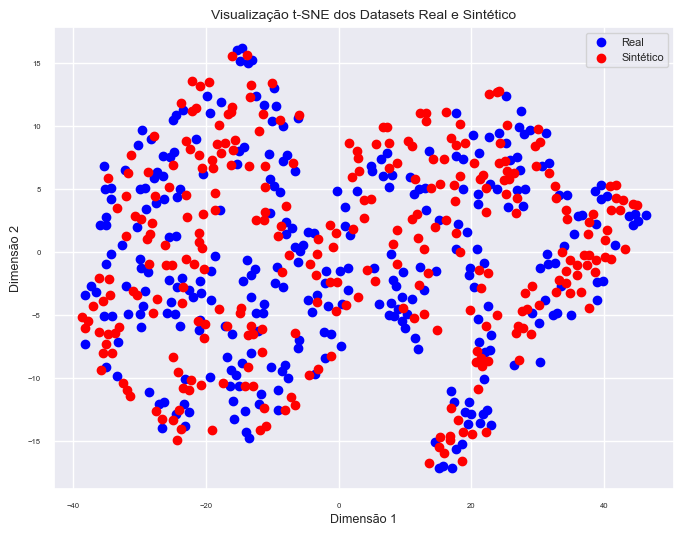

In [12]:
plt.figure(figsize=(8, 6))
plt.scatter(X_tsne[y == 0][:, 0], X_tsne[y == 0][:, 1], label="Real", c="blue")
plt.scatter(X_tsne[y == 1][:, 0], X_tsne[y == 1][:, 1], label="Sintético", c="red")
plt.legend(fontsize=8)
plt.title("Visualização t-SNE dos Datasets Real e Sintético", fontsize=10)
plt.xlabel("Dimensão 1", fontsize=9)
plt.ylabel("Dimensão 2", fontsize=9)
plt.savefig("data/heart_cleveland/results/heart_cleveland_tsne.png")
plt.show()

## Processos de Classificação

In [18]:
df = pd.read_csv("data/heart_cleveland/heart_cleveland.csv")
cat_features = ["sex", "restecg", "slope", "cp", "exang", "thal", "ca", "fbs"]
num_features = ["age", "oldpeak", "trestbps", "thalach", "chol"]
float_to_int_features = cat_features
target = "condition"

metadata = SingleTableMetadata()
metadata.detect_from_dataframe(data=df)
metadata

metadata.update_column(
    column_name="age", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="oldpeak", sdtype="numerical", computer_representation="Float"
)

metadata.update_column(
    column_name="trestbps", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="thalach", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="chol", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="sex", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="restecg", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="slope", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="cp", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="exang", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="thal", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="ca", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="fbs", sdtype="numerical", computer_representation="Int32"
)

metadata.update_column(
    column_name="condition", sdtype="numerical", computer_representation="Int32"
)

y = df[target]
X = df.drop(target, axis=1)

### Baseline: Avaliação dos Modelos apenas com Dados Reais

In [15]:
baseline_df = evaluation_pipeline(
    X=X,
    y=y,
    num_features=num_features,
    cat_features=cat_features,
    sampling_strategy="BASELINE",
)
baseline_df.to_csv("data/heart_cleveland/results/baseline_df.csv", index=False)
baseline_df

Sampling Strategy: BASELINE

Training Model: SVC()
Training fold 1...
Training fold 2...
Training fold 3...
Training fold 4...
Training fold 5...

Training Model: DecisionTreeClassifier()
Training fold 1...
Training fold 2...
Training fold 3...
Training fold 4...
Training fold 5...

Training Model: KNeighborsClassifier()
Training fold 1...
Training fold 2...
Training fold 3...
Training fold 4...
Training fold 5...

Training Model: RandomForestClassifier()
Training fold 1...
Training fold 2...
Training fold 3...
Training fold 4...
Training fold 5...

Training Model: LogisticRegression(max_iter=1000)
Training fold 1...
Training fold 2...
Training fold 3...
Training fold 4...
Training fold 5...

Training Model: MLPClassifier(max_iter=1000)
Training fold 1...
Training fold 2...
Training fold 3...
Training fold 4...
Training fold 5...


,Classification,Accuracy,Precision,Recall,F1 Score,ROC/AUC
0,Decision Tree,0.6872 +- 0.07,0.6565 +- 0.10,0.6745 +- 0.15,0.6589 +- 0.10,0.6853 +- 0.07
1,KNN,0.7577 +- 0.03,0.7366 +- 0.03,0.7379 +- 0.06,0.7363 +- 0.04,0.7562 +- 0.03
2,Logistic Regression,0.8448 +- 0.08,0.8561 +- 0.13,0.7981 +- 0.11,0.8215 +- 0.10,0.8463 +- 0.08
3,MLP,0.8047 +- 0.03,0.7963 +- 0.09,0.7935 +- 0.08,0.7883 +- 0.01,0.8074 +- 0.02
4,Random Forest,0.8013 +- 0.03,0.8050 +- 0.07,0.7587 +- 0.06,0.7779 +- 0.02,0.7964 +- 0.03
5,SVM,0.8350 +- 0.06,0.8635 +- 0.13,0.7893 +- 0.09,0.8159 +- 0.06,0.8377 +- 0.06


### TBTR: Avaliação por Incrementação Dados Sintéticos + Reais, apenas no conjunto de treino

In [19]:
tbtr_df = evaluation_pipeline(
    X=X,
    y=y,
    num_features=num_features,
    cat_features=cat_features,
    float_to_int_features=float_to_int_features,
    sampling_strategy="TBTR",
    metadata=metadata,
    target=target,
)
tbtr_df.to_csv("data/heart_cleveland/results/tbtr_df.csv", index=False)
tbtr_df

Sampling Strategy: TBTR

Training Model: SVC()
Training fold 1...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 81.55it/s]


Training fold 2...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 72.96it/s]


Training fold 3...


Sampling conditions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 119.40it/s]


Training fold 4...


Sampling conditions: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 34.19it/s]


Training fold 5...


Sampling conditions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 110.09it/s]



Training Model: DecisionTreeClassifier()
Training fold 1...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 27.03it/s]


Training fold 2...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 68.81it/s]


Training fold 3...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 77.59it/s]


Training fold 4...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 66.67it/s]


Training fold 5...


Sampling conditions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 141.30it/s]



Training Model: KNeighborsClassifier()
Training fold 1...


Sampling conditions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 123.66it/s]


Training fold 2...


Sampling conditions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 101.19it/s]


Training fold 3...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 96.62it/s]


Training fold 4...


Sampling conditions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 166.67it/s]


Training fold 5...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 76.43it/s]



Training Model: RandomForestClassifier()
Training fold 1...


Sampling conditions: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 41.67it/s]


Training fold 2...


Sampling conditions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 112.40it/s]


Training fold 3...


Sampling conditions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 103.77it/s]


Training fold 4...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 41.03it/s]


Training fold 5...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 72.00it/s]



Training Model: LogisticRegression(max_iter=1000)
Training fold 1...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 55.32it/s]


Training fold 2...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 25.04it/s]


Training fold 3...


Sampling conditions: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 21.56it/s]


Training fold 4...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 62.36it/s]


Training fold 5...


Sampling conditions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 132.70it/s]



Training Model: MLPClassifier(max_iter=1000)
Training fold 1...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 72.63it/s]


Training fold 2...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:00<00:00, 56.48it/s]


Training fold 3...


Sampling conditions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 32/32 [00:00<00:00, 200.00it/s]


Training fold 4...


Sampling conditions: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 136.98it/s]


Training fold 5...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 72.46it/s]


,Classification,Accuracy,Precision,Recall,F1 Score,ROC/AUC
0,Decision Tree,0.7073 +- 0.06,0.6853 +- 0.09,0.6848 +- 0.14,0.6786 +- 0.09,0.7053 +- 0.06
1,KNN,0.7644 +- 0.03,0.7400 +- 0.03,0.7517 +- 0.06,0.7451 +- 0.04,0.7631 +- 0.03
2,Logistic Regression,0.8414 +- 0.08,0.8373 +- 0.11,0.8106 +- 0.10,0.8210 +- 0.10,0.8414 +- 0.08
3,MLP,0.8148 +- 0.03,0.7952 +- 0.09,0.8225 +- 0.06,0.8036 +- 0.02,0.8186 +- 0.03
4,Random Forest,0.8182 +- 0.05,0.8139 +- 0.07,0.7901 +- 0.06,0.7994 +- 0.04,0.8105 +- 0.04
5,SVM,0.8284 +- 0.07,0.8545 +- 0.15,0.7965 +- 0.09,0.8125 +- 0.06,0.8323 +- 0.07


### TSTR: Treinar com dados sintéticos, testar com dados reais

In [ ]:
tstr_df = evaluation_pipeline(X = X, y = y, num_features = num_features, cat_features = cat_features, float_to_int_features=float_to_int_features, sampling_strategy = "TSTR", metadata = metadata, target = target)
tstr_df.to_csv("data/heart_cleveland/results/tstr_df.csv", index=False)
tstr_df

Sampling Strategy: TSTR

Training Model: SVC()
Training fold 1...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 256/256 [00:00<00:00, 752.93it/s]


Training fold 2...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 254/254 [00:00<00:00, 450.36it/s]


Training fold 3...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 262/262 [00:00<00:00, 472.92it/s]


Training fold 4...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 246/246 [00:00<00:00, 540.66it/s]


Training fold 5...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 262/262 [00:00<00:00, 742.21it/s]



Training Model: DecisionTreeClassifier()
Training fold 1...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 252/252 [00:00<00:00, 499.01it/s]


Training fold 2...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 252/252 [00:00<00:00, 544.27it/s]


Training fold 3...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 256/256 [00:00<00:00, 723.16it/s]


Training fold 4...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 256/256 [00:00<00:00, 1224.87it/s]


Training fold 5...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 264/264 [00:00<00:00, 564.10it/s]



Training Model: KNeighborsClassifier()
Training fold 1...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 260/260 [00:00<00:00, 738.64it/s]


Training fold 2...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 254/254 [00:00<00:00, 585.26it/s]


Training fold 3...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 258/258 [00:00<00:00, 505.88it/s]


Training fold 4...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 258/258 [00:00<00:00, 562.09it/s]


Training fold 5...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [00:00<00:00, 664.90it/s]



Training Model: RandomForestClassifier()
Training fold 1...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 244/244 [00:00<00:00, 545.86it/s]


Training fold 2...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 266/266 [00:00<00:00, 603.17it/s]


Training fold 3...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 260/260 [00:00<00:00, 406.25it/s]


Training fold 4...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 254/254 [00:01<00:00, 164.19it/s]


Training fold 5...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 256/256 [00:00<00:00, 1354.51it/s]



Training Model: LogisticRegression(max_iter=1000)
Training fold 1...


Sampling conditions: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [00:00<00:00, 1288.68it/s]


Training fold 2...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 252/252 [00:00<00:00, 471.91it/s]


Training fold 3...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 246/246 [00:00<00:00, 740.97it/s]


Training fold 4...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 266/266 [00:00<00:00, 794.03it/s]


Training fold 5...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 266/266 [00:00<00:00, 794.03it/s]



Training Model: MLPClassifier(max_iter=1000)
Training fold 1...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [00:00<00:00, 724.63it/s]


Training fold 2...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 254/254 [00:00<00:00, 568.23it/s]


Training fold 3...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 270/270 [00:00<00:00, 828.21it/s]


Training fold 4...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 258/258 [00:00<00:00, 883.57it/s]


Training fold 5...


Sampling conditions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 248/248 [00:00<00:00, 852.23it/s]


,Classification,Accuracy,Precision,Recall,F1 Score,ROC/AUC
0,Decision Tree,0.7676 +- 0.02,0.7519 +- 0.06,0.7657 +- 0.13,0.7494 +- 0.04,0.7658 +- 0.02
1,KNN,0.7205 +- 0.07,0.7314 +- 0.10,0.6424 +- 0.05,0.6826 +- 0.06,0.7126 +- 0.07
2,Logistic Regression,0.8178 +- 0.09,0.8218 +- 0.12,0.7548 +- 0.13,0.7849 +- 0.12,0.8134 +- 0.09
3,MLP,0.8284 +- 0.02,0.8487 +- 0.05,0.7556 +- 0.06,0.7984 +- 0.05,0.8222 +- 0.03
4,Random Forest,0.8249 +- 0.05,0.8423 +- 0.05,0.7675 +- 0.03,0.8030 +- 0.04,0.8192 +- 0.04
5,SVM,0.8014 +- 0.06,0.8423 +- 0.13,0.7292 +- 0.10,0.7713 +- 0.06,0.8015 +- 0.06


### SMOTE: Treinar com dados balanceados utilizando SMOTE, testar com dados reais

In [ ]:
smote_df = evaluation_pipeline(X = X, y = y, num_features = num_features, cat_features = cat_features, sampling_strategy = "SMOTE")
smote_df.to_csv("data/heart_cleveland/results/smote_df.csv", index=False)
smote_df

Sampling Strategy: SMOTE

Training Model: SVC()
Training fold 1...
Training fold 2...
Training fold 3...
Training fold 4...
Training fold 5...

Training Model: DecisionTreeClassifier()
Training fold 1...
Training fold 2...
Training fold 3...
Training fold 4...
Training fold 5...

Training Model: KNeighborsClassifier()
Training fold 1...
Training fold 2...
Training fold 3...
Training fold 4...
Training fold 5...

Training Model: RandomForestClassifier()
Training fold 1...
Training fold 2...
Training fold 3...
Training fold 4...
Training fold 5...

Training Model: LogisticRegression(max_iter=1000)
Training fold 1...
Training fold 2...
Training fold 3...
Training fold 4...
Training fold 5...

Training Model: MLPClassifier(max_iter=1000)
Training fold 1...
Training fold 2...
Training fold 3...
Training fold 4...
Training fold 5...


,Classification,Accuracy,Precision,Recall,F1 Score,ROC/AUC
0,Decision Tree,0.6736 +- 0.08,0.6593 +- 0.13,0.6416 +- 0.10,0.6440 +- 0.09,0.6724 +- 0.08
1,KNN,0.7542 +- 0.04,0.7269 +- 0.03,0.7445 +- 0.07,0.7351 +- 0.05,0.7531 +- 0.04
2,Logistic Regression,0.8413 +- 0.08,0.8329 +- 0.11,0.8186 +- 0.10,0.8227 +- 0.10,0.8417 +- 0.08
3,MLP,0.8115 +- 0.01,0.7969 +- 0.09,0.8089 +- 0.07,0.7964 +- 0.01,0.8167 +- 0.02
4,Random Forest,0.8114 +- 0.04,0.7919 +- 0.05,0.8020 +- 0.07,0.7948 +- 0.04,0.8088 +- 0.04
5,SVM,0.8350 +- 0.08,0.8320 +- 0.13,0.8320 +- 0.10,0.8243 +- 0.08,0.8398 +- 0.08


### Final

In [ ]:
baseline_df

,Classification,Accuracy,Precision,Recall,F1 Score,ROC/AUC
0,Decision Tree,0.6872 +- 0.07,0.6565 +- 0.10,0.6745 +- 0.15,0.6589 +- 0.10,0.6853 +- 0.07
1,KNN,0.7577 +- 0.03,0.7366 +- 0.03,0.7379 +- 0.06,0.7363 +- 0.04,0.7562 +- 0.03
2,Logistic Regression,0.8448 +- 0.08,0.8561 +- 0.13,0.7981 +- 0.11,0.8215 +- 0.10,0.8463 +- 0.08
3,MLP,0.8047 +- 0.03,0.7963 +- 0.09,0.7935 +- 0.08,0.7883 +- 0.01,0.8074 +- 0.02
4,Random Forest,0.8013 +- 0.03,0.8050 +- 0.07,0.7587 +- 0.06,0.7779 +- 0.02,0.7964 +- 0.03
5,SVM,0.8350 +- 0.06,0.8635 +- 0.13,0.7893 +- 0.09,0.8159 +- 0.06,0.8377 +- 0.06


In [ ]:
tbtr_df

,Classification,Accuracy,Precision,Recall,F1 Score,ROC/AUC
0,Decision Tree,0.7073 +- 0.06,0.6853 +- 0.09,0.6848 +- 0.14,0.6786 +- 0.09,0.7053 +- 0.06
1,KNN,0.7644 +- 0.03,0.7400 +- 0.03,0.7517 +- 0.06,0.7451 +- 0.04,0.7631 +- 0.03
2,Logistic Regression,0.8414 +- 0.08,0.8373 +- 0.11,0.8106 +- 0.10,0.8210 +- 0.10,0.8414 +- 0.08
3,MLP,0.8148 +- 0.03,0.7952 +- 0.09,0.8225 +- 0.06,0.8036 +- 0.02,0.8186 +- 0.03
4,Random Forest,0.8182 +- 0.05,0.8139 +- 0.07,0.7901 +- 0.06,0.7994 +- 0.04,0.8105 +- 0.04
5,SVM,0.8284 +- 0.07,0.8545 +- 0.15,0.7965 +- 0.09,0.8125 +- 0.06,0.8323 +- 0.07


In [ ]:
tstr_df

,Classification,Accuracy,Precision,Recall,F1 Score,ROC/AUC
0,Decision Tree,0.7676 +- 0.02,0.7519 +- 0.06,0.7657 +- 0.13,0.7494 +- 0.04,0.7658 +- 0.02
1,KNN,0.7205 +- 0.07,0.7314 +- 0.10,0.6424 +- 0.05,0.6826 +- 0.06,0.7126 +- 0.07
2,Logistic Regression,0.8178 +- 0.09,0.8218 +- 0.12,0.7548 +- 0.13,0.7849 +- 0.12,0.8134 +- 0.09
3,MLP,0.8284 +- 0.02,0.8487 +- 0.05,0.7556 +- 0.06,0.7984 +- 0.05,0.8222 +- 0.03
4,Random Forest,0.8249 +- 0.05,0.8423 +- 0.05,0.7675 +- 0.03,0.8030 +- 0.04,0.8192 +- 0.04
5,SVM,0.8014 +- 0.06,0.8423 +- 0.13,0.7292 +- 0.10,0.7713 +- 0.06,0.8015 +- 0.06


In [ ]:
smote_df

,Classification,Accuracy,Precision,Recall,F1 Score,ROC/AUC
0,Decision Tree,0.6736 +- 0.08,0.6593 +- 0.13,0.6416 +- 0.10,0.6440 +- 0.09,0.6724 +- 0.08
1,KNN,0.7542 +- 0.04,0.7269 +- 0.03,0.7445 +- 0.07,0.7351 +- 0.05,0.7531 +- 0.04
2,Logistic Regression,0.8413 +- 0.08,0.8329 +- 0.11,0.8186 +- 0.10,0.8227 +- 0.10,0.8417 +- 0.08
3,MLP,0.8115 +- 0.01,0.7969 +- 0.09,0.8089 +- 0.07,0.7964 +- 0.01,0.8167 +- 0.02
4,Random Forest,0.8114 +- 0.04,0.7919 +- 0.05,0.8020 +- 0.07,0.7948 +- 0.04,0.8088 +- 0.04
5,SVM,0.8350 +- 0.08,0.8320 +- 0.13,0.8320 +- 0.10,0.8243 +- 0.08,0.8398 +- 0.08
